## Copyright 2022 Google LLC. Double-click for license information.

In [1]:
# Copyright 2022 Google LLC
#
# Licensed under the Apache License, Version 2.0 (the "License");
# you may not use this file except in compliance with the License.
# You may obtain a copy of the License at
#
#      http://www.apache.org/licenses/LICENSE-2.0
#
# Unless required by applicable law or agreed to in writing, software
# distributed under the License is distributed on an "AS IS" BASIS,
# WITHOUT WARRANTIES OR CONDITIONS OF ANY KIND, either express or implied.
# See the License for the specific language governing permissions and
# limitations under the License.

## Prompt-to-Prompt with Stable Diffusion

In [2]:
from typing import Optional, Union, Tuple, List, Callable, Dict
import torch
from diffusers import StableDiffusionPipeline
import torch.nn.functional as nnf
import numpy as np
import abc
import ptp_utils
import seq_aligner
import os
from dotenv import load_dotenv

For loading the Stable Diffusion using Diffusers, follow the instuctions https://huggingface.co/blog/stable_diffusion and update ```MY_TOKEN``` with your token.
Set ```LOW_RESOURCE``` to ```True``` for running on 12GB GPU.

In [3]:
load_dotenv()

SD_TOKEN = os.getenv("SD_TOKEN")
LOW_RESOURCE = True
NUM_DIFFUSION_STEPS = 50
GUIDANCE_SCALE = 7.5
MAX_NUM_WORDS = 77

device = torch.device('cuda:0') if torch.cuda.is_available() else torch.device('cpu')
device = torch.device('mps') if torch.backends.mps.is_available() else device
print('Device type:', device.type)

ldm_stable = StableDiffusionPipeline.from_pretrained("CompVis/stable-diffusion-v1-4", use_auth_token=SD_TOKEN).to(device)
tokenizer = ldm_stable.tokenizer

Device type: mps


/Users/simon/Code/personal/apemallet/prompt-to-prompt/venv/lib/python3.8/site-packages/huggingface_hub/file_download.py:1142: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(


Fetching 30 files:   0%|          | 0/30 [00:00<?, ?it/s]

/Users/simon/Code/personal/apemallet/prompt-to-prompt/venv/lib/python3.8/site-packages/diffusers/modeling_utils.py:90: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  return t

## Prompt-to-Prompt Attnetion Controllers
Our main logic is implemented in the `forward` call in an `AttentionControl` object.
The forward is called in each attention layer of the diffusion model and it can modify the input attnetion weights `attn`.

`is_cross`, `place_in_unet in ("down", "mid", "up")`, `AttentionControl.cur_step` help us track the exact attention layer and timestamp during the diffusion iference.


In [4]:
class LocalBlend:

    def __call__(self, x_t, attention_store):
        k = 1
        maps = attention_store["down_cross"][2:4] + attention_store["up_cross"][:3]
        maps = [item.reshape(self.alpha_layers.shape[0], -1, 1, 16, 16, MAX_NUM_WORDS) for item in maps]
        maps = torch.cat(maps, dim=1)
        maps = (maps * self.alpha_layers).sum(-1).mean(1)
        mask = nnf.max_pool2d(maps, (k * 2 + 1, k * 2 +1), (1, 1), padding=(k, k))
        mask = nnf.interpolate(mask, size=(x_t.shape[2:]))
        mask = mask / mask.max(2, keepdims=True)[0].max(3, keepdims=True)[0]
        mask = mask.gt(self.threshold)
        mask = (mask[:1] + mask[1:]).float()
        x_t = x_t[:1] + mask * (x_t - x_t[:1])
        return x_t
       
    def __init__(self, prompts: List[str], words: [List[List[str]]], threshold=.3):
        alpha_layers = torch.zeros(len(prompts),  1, 1, 1, 1, MAX_NUM_WORDS)
        for i, (prompt, words_) in enumerate(zip(prompts, words)):
            if type(words_) is str:
                words_ = [words_]
            for word in words_:
                ind = ptp_utils.get_word_inds(prompt, word, tokenizer)
                alpha_layers[i, :, :, :, :, ind] = 1
        self.alpha_layers = alpha_layers.to(device)
        self.threshold = threshold


class AttentionControl(abc.ABC):
    
    def step_callback(self, x_t):
        return x_t
    
    def between_steps(self):
        return
    
    @property
    def num_uncond_att_layers(self):
        return self.num_att_layers if LOW_RESOURCE else 0
    
    @abc.abstractmethod
    def forward (self, attn, is_cross: bool, place_in_unet: str):
        raise NotImplementedError

    def __call__(self, attn, is_cross: bool, place_in_unet: str):
        if self.cur_att_layer >= self.num_uncond_att_layers:
            if LOW_RESOURCE:
                attn = self.forward(attn, is_cross, place_in_unet)
            else:
                h = attn.shape[0]
                attn[h // 2:] = self.forward(attn[h // 2:], is_cross, place_in_unet)
        self.cur_att_layer += 1
        if self.cur_att_layer == self.num_att_layers + self.num_uncond_att_layers:
            self.cur_att_layer = 0
            self.cur_step += 1
            self.between_steps()
        return attn
    
    def reset(self):
        self.cur_step = 0
        self.cur_att_layer = 0

    def __init__(self):
        self.cur_step = 0
        self.num_att_layers = -1
        self.cur_att_layer = 0

class EmptyControl(AttentionControl):
    
    def forward (self, attn, is_cross: bool, place_in_unet: str):
        return attn
    
    
class AttentionStore(AttentionControl):

    @staticmethod
    def get_empty_store():
        return {"down_cross": [], "mid_cross": [], "up_cross": [],
                "down_self": [],  "mid_self": [],  "up_self": []}

    def forward(self, attn, is_cross: bool, place_in_unet: str):
        key = f"{place_in_unet}_{'cross' if is_cross else 'self'}"
        if attn.shape[1] <= 32 ** 2:  # avoid memory overhead
            self.step_store[key].append(attn)
        return attn

    def between_steps(self):
        if len(self.attention_store) == 0:
            self.attention_store = self.step_store
        else:
            for key in self.attention_store:
                for i in range(len(self.attention_store[key])):
                    self.attention_store[key][i] += self.step_store[key][i]
        self.step_store = self.get_empty_store()

    def get_average_attention(self):
        average_attention = {key: [item / self.cur_step for item in self.attention_store[key]] for key in self.attention_store}
        return average_attention


    def reset(self):
        super(AttentionStore, self).reset()
        self.step_store = self.get_empty_store()
        self.attention_store = {}

    def __init__(self):
        super(AttentionStore, self).__init__()
        self.step_store = self.get_empty_store()
        self.attention_store = {}

        
class AttentionControlEdit(AttentionStore, abc.ABC):
    
    def step_callback(self, x_t):
        if self.local_blend is not None:
            x_t = self.local_blend(x_t, self.attention_store)
        return x_t
        
    def replace_self_attention(self, attn_base, att_replace):
        if att_replace.shape[2] <= 16 ** 2:
            return attn_base.unsqueeze(0).expand(att_replace.shape[0], *attn_base.shape)
        else:
            return att_replace
    
    @abc.abstractmethod
    def replace_cross_attention(self, attn_base, att_replace):
        raise NotImplementedError
    
    def forward(self, attn, is_cross: bool, place_in_unet: str):
        super(AttentionControlEdit, self).forward(attn, is_cross, place_in_unet)
        if is_cross or (self.num_self_replace[0] <= self.cur_step < self.num_self_replace[1]):
            h = attn.shape[0] // (self.batch_size)
            attn = attn.reshape(self.batch_size, h, *attn.shape[1:])
            attn_base, attn_repalce = attn[0], attn[1:]
            if is_cross:
                alpha_words = self.cross_replace_alpha[self.cur_step]
                attn_repalce_new = self.replace_cross_attention(attn_base, attn_repalce) * alpha_words + (1 - alpha_words) * attn_repalce
                attn[1:] = attn_repalce_new
            else:
                attn[1:] = self.replace_self_attention(attn_base, attn_repalce)
            attn = attn.reshape(self.batch_size * h, *attn.shape[2:])
        return attn
    
    def __init__(self, prompts, num_steps: int,
                 cross_replace_steps: Union[float, Tuple[float, float], Dict[str, Tuple[float, float]]],
                 self_replace_steps: Union[float, Tuple[float, float]],
                 local_blend: Optional[LocalBlend]):
        super(AttentionControlEdit, self).__init__()
        self.batch_size = len(prompts)
        self.cross_replace_alpha = ptp_utils.get_time_words_attention_alpha(prompts, num_steps, cross_replace_steps, tokenizer).to(device)
        if type(self_replace_steps) is float:
            self_replace_steps = 0, self_replace_steps
        self.num_self_replace = int(num_steps * self_replace_steps[0]), int(num_steps * self_replace_steps[1])
        self.local_blend = local_blend

class AttentionReplace(AttentionControlEdit):

    def replace_cross_attention(self, attn_base, att_replace):
        return torch.einsum('hpw,bwn->bhpn', attn_base, self.mapper)
      
    def __init__(self, prompts, num_steps: int, cross_replace_steps: float, self_replace_steps: float,
                 local_blend: Optional[LocalBlend] = None):
        super(AttentionReplace, self).__init__(prompts, num_steps, cross_replace_steps, self_replace_steps, local_blend)
        self.mapper = seq_aligner.get_replacement_mapper(prompts, tokenizer).to(device)
        

class AttentionRefine(AttentionControlEdit):

    def replace_cross_attention(self, attn_base, att_replace):
        attn_base_replace = attn_base[:, :, self.mapper].permute(2, 0, 1, 3)
        attn_replace = attn_base_replace * self.alphas + att_replace * (1 - self.alphas)
        return attn_replace

    def __init__(self, prompts, num_steps: int, cross_replace_steps: float, self_replace_steps: float,
                 local_blend: Optional[LocalBlend] = None):
        super(AttentionRefine, self).__init__(prompts, num_steps, cross_replace_steps, self_replace_steps, local_blend)
        self.mapper, alphas = seq_aligner.get_refinement_mapper(prompts, tokenizer)
        self.mapper, alphas = self.mapper.to(device), alphas.to(device)
        self.alphas = alphas.reshape(alphas.shape[0], 1, 1, alphas.shape[1])


class AttentionReweight(AttentionControlEdit):

    def replace_cross_attention(self, attn_base, att_replace):
        if self.prev_controller is not None:
            attn_base = self.prev_controller.replace_cross_attention(attn_base, att_replace)
        attn_replace = attn_base[None, :, :, :] * self.equalizer[:, None, None, :]
        return attn_replace

    def __init__(self, prompts, num_steps: int, cross_replace_steps: float, self_replace_steps: float, equalizer,
                local_blend: Optional[LocalBlend] = None, controller: Optional[AttentionControlEdit] = None):
        super(AttentionReweight, self).__init__(prompts, num_steps, cross_replace_steps, self_replace_steps, local_blend)
        self.equalizer = equalizer.to(device)
        self.prev_controller = controller


def get_equalizer(text: str, word_select: Union[int, Tuple[int, ...]], values: Union[List[float],
                  Tuple[float, ...]]):
    if type(word_select) is int or type(word_select) is str:
        word_select = (word_select,)
    equalizer = torch.ones(len(values), 77)
    values = torch.tensor(values, dtype=torch.float32)
    for word in word_select:
        inds = ptp_utils.get_word_inds(text, word, tokenizer)
        equalizer[:, inds] = values
    return equalizer


In [5]:
from PIL import Image

def aggregate_attention(attention_store: AttentionStore, res: int, from_where: List[str], is_cross: bool, select: int):
    out = []
    attention_maps = attention_store.get_average_attention()
    num_pixels = res ** 2
    for location in from_where:
        for item in attention_maps[f"{location}_{'cross' if is_cross else 'self'}"]:
            if item.shape[1] == num_pixels:
                cross_maps = item.reshape(len(prompts), -1, res, res, item.shape[-1])[select]
                out.append(cross_maps)
    out = torch.cat(out, dim=0)
    out = out.sum(0) / out.shape[0]
    return out.cpu()


def show_cross_attention(attention_store: AttentionStore, res: int, from_where: List[str], select: int = 0):
    tokens = tokenizer.encode(prompts[select])
    decoder = tokenizer.decode
    attention_maps = aggregate_attention(attention_store, res, from_where, True, select)
    images = []
    for i in range(len(tokens)):
        image = attention_maps[:, :, i]
        image = 255 * image / image.max()
        image = image.unsqueeze(-1).expand(*image.shape, 3)
        image = image.numpy().astype(np.uint8)
        image = np.array(Image.fromarray(image).resize((256, 256)))
        image = ptp_utils.text_under_image(image, decoder(int(tokens[i])))
        images.append(image)
    ptp_utils.view_images(np.stack(images, axis=0))
    

def show_self_attention_comp(attention_store: AttentionStore, res: int, from_where: List[str],
                        max_com=10, select: int = 0):
    attention_maps = aggregate_attention(attention_store, res, from_where, False, select).numpy().reshape((res ** 2, res ** 2))
    u, s, vh = np.linalg.svd(attention_maps - np.mean(attention_maps, axis=1, keepdims=True))
    images = []
    for i in range(max_com):
        image = vh[i].reshape(res, res)
        image = image - image.min()
        image = 255 * image / image.max()
        image = np.repeat(np.expand_dims(image, axis=2), 3, axis=2).astype(np.uint8)
        image = Image.fromarray(image).resize((256, 256))
        image = np.array(image)
        images.append(image)
    ptp_utils.view_images(np.concatenate(images, axis=1))

In [6]:
def run_and_display(prompts, controller, latent=None, run_baseline=False, generator=None):
    if run_baseline:
        print("w.o. prompt-to-prompt")
        images, latent = run_and_display(prompts, EmptyControl(), latent=latent, run_baseline=False, generator=generator)
        print("with prompt-to-prompt")
    images, x_t = ptp_utils.text2image_ldm_stable(ldm_stable, prompts, controller, latent=latent, num_inference_steps=NUM_DIFFUSION_STEPS, guidance_scale=GUIDANCE_SCALE, generator=generator, low_resource=LOW_RESOURCE)
    ptp_utils.view_images(images)
    return images, x_t

## Cross-Attention Visualization
First let's generate an image and visualize the cross-attention maps for each word in the prompt.
Notice, we normalize each map to 0-1.

  0%|          | 0/51 [00:00<?, ?it/s]

Step offset default: 1


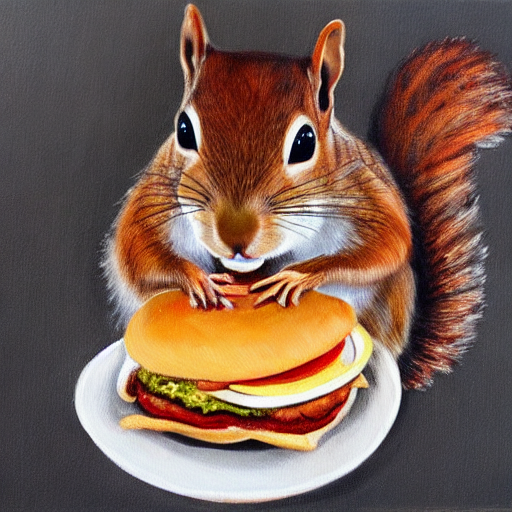

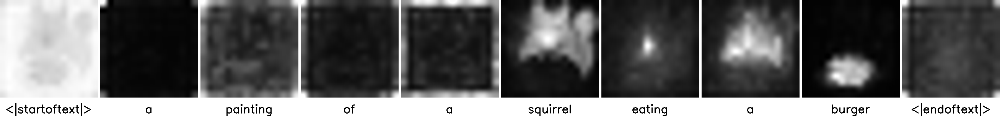

In [7]:
# g_cpu = torch.Generator().manual_seed(8888)
g_cpu = torch.Generator().manual_seed(666)
prompts = ["A painting of a squirrel eating a burger"]
controller = AttentionStore()
image, x_t = run_and_display(prompts, controller, latent=None, run_baseline=False, generator=g_cpu)
show_cross_attention(controller, res=16, from_where=("up", "down"))

## Replacement edit

w.o. prompt-to-prompt


  0%|          | 0/51 [00:00<?, ?it/s]

Step offset default: 1


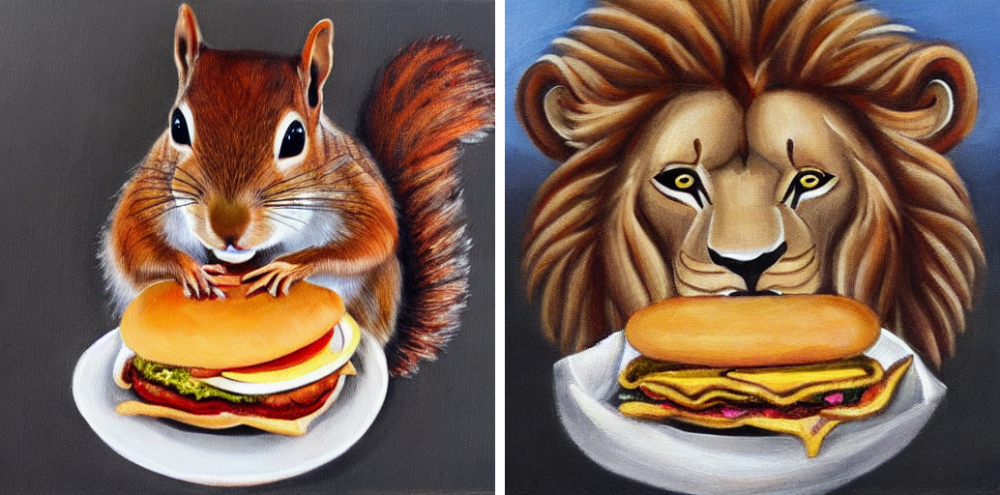

with prompt-to-prompt


  0%|          | 0/51 [00:00<?, ?it/s]

Step offset default: 1


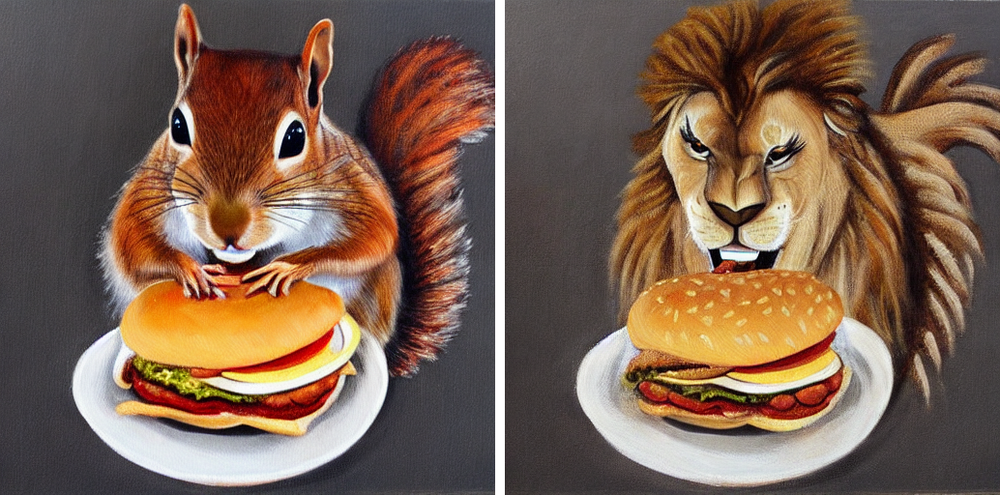

In [8]:
prompts = ["A painting of a squirrel eating a burger",
           "A painting of a lion eating a burger"]

controller = AttentionReplace(prompts, NUM_DIFFUSION_STEPS, cross_replace_steps=.8, self_replace_steps=0.4)
_ = run_and_display(prompts, controller, latent=x_t, run_baseline=True)


### Modify Cross-Attention injection #steps for specific words
Next, we can reduce the restriction on our lion by reducing the number of cross-attention injection with respect to the word "lion".

  0%|          | 0/51 [00:00<?, ?it/s]

Step offset default: 1


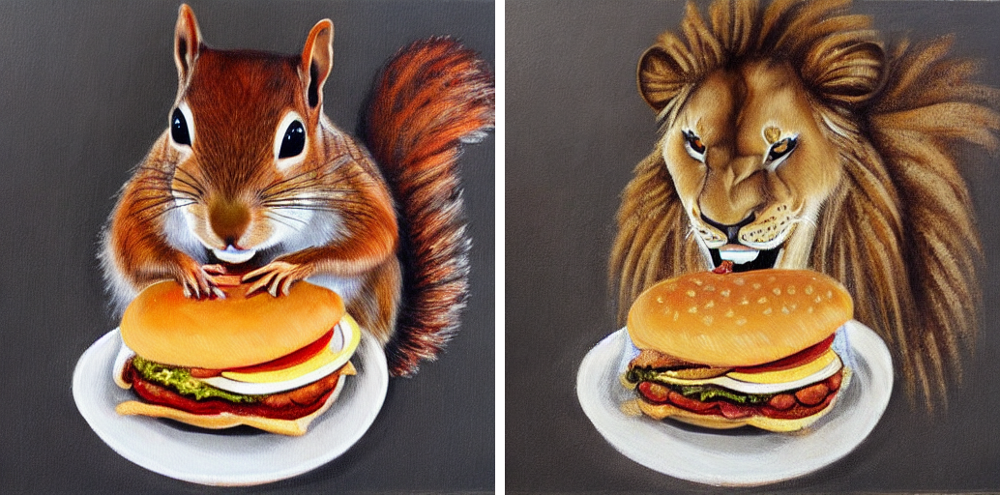

In [9]:
prompts = ["A painting of a squirrel eating a burger",
           "A painting of a lion eating a burger"]
controller = AttentionReplace(prompts, NUM_DIFFUSION_STEPS, cross_replace_steps={"default_": 1., "lion": .4},
                              self_replace_steps=0.4)
_ = run_and_display(prompts, controller, latent=x_t, run_baseline=False)

### Local Edit
Lastly, if we want to preseve the original burger, we can apply a local edit with respect to the squirrel and the lion

  0%|          | 0/51 [00:00<?, ?it/s]

Step offset default: 1


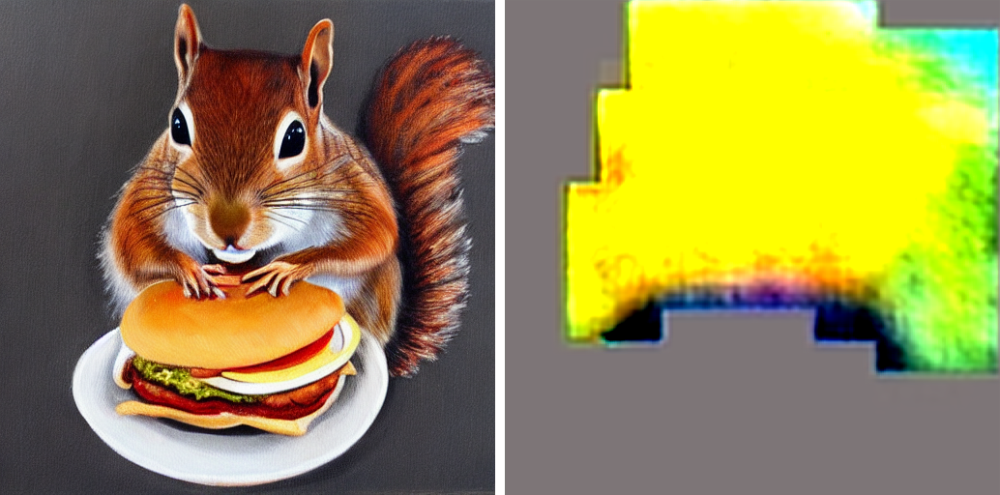

In [10]:
prompts = ["A painting of a squirrel eating a burger",
           "A painting of a lion eating a burger"]
lb = LocalBlend(prompts, ("squirrel", "lion"))
controller = AttentionReplace(prompts, NUM_DIFFUSION_STEPS,
                              cross_replace_steps={"default_": 1., "lion": .4},
                              self_replace_steps=0.4, local_blend=lb)
_ = run_and_display(prompts, controller, latent=x_t, run_baseline=False)

w.o. prompt-to-prompt


  0%|          | 0/51 [00:00<?, ?it/s]

Step offset default: 1


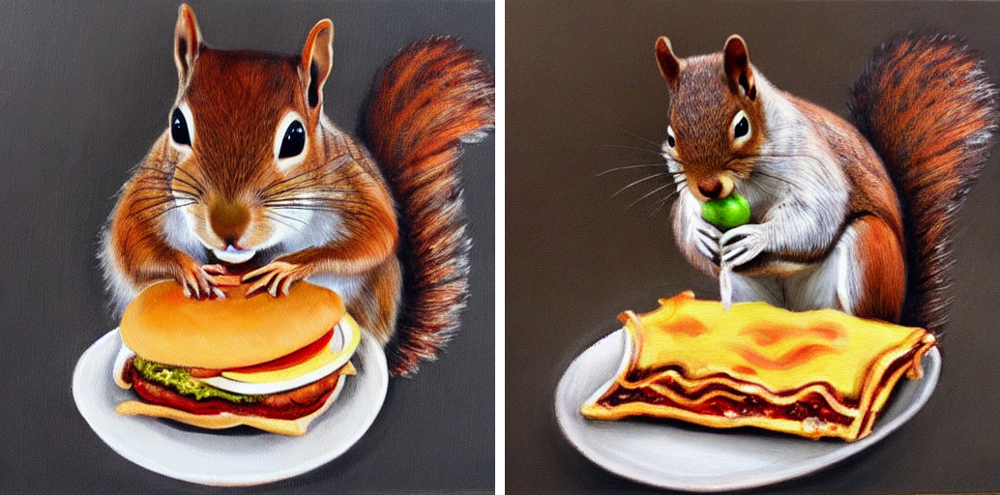

with prompt-to-prompt


  0%|          | 0/51 [00:00<?, ?it/s]

Step offset default: 1


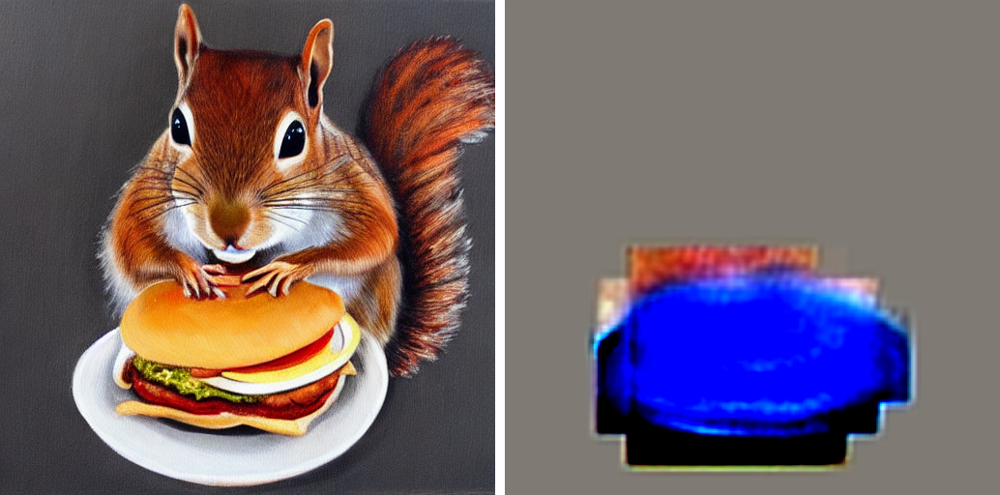

In [11]:
prompts = ["A painting of a squirrel eating a burger",
           "A painting of a squirrel eating a lasagne"]
lb = LocalBlend(prompts, ("burger", "lasagne"))
controller = AttentionReplace(prompts, NUM_DIFFUSION_STEPS,
                              cross_replace_steps={"default_": 1., "lasagne": .2},
                              self_replace_steps=0.4,
                              local_blend=lb)
_ = run_and_display(prompts, controller, latent=x_t, run_baseline=True)

## Refinement edit

  0%|          | 0/51 [00:00<?, ?it/s]

Step offset default: 1


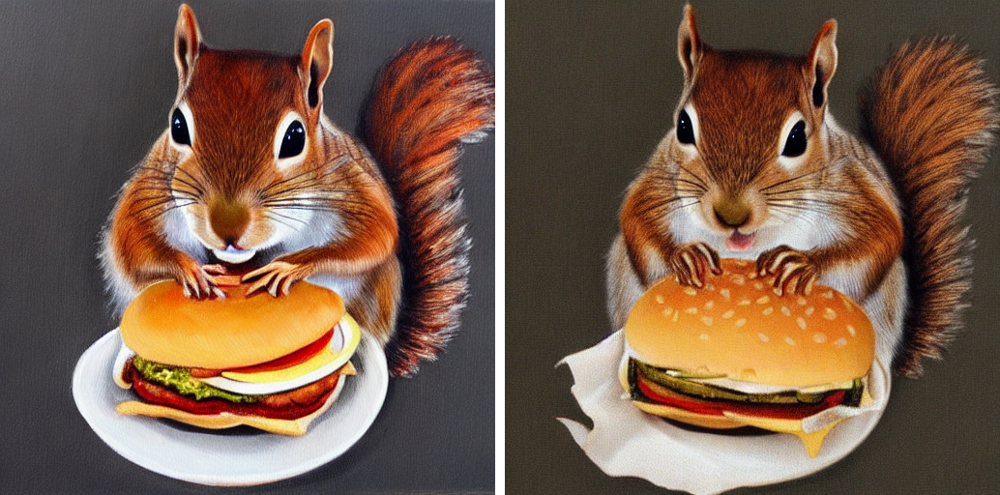

In [12]:
prompts = ["A painting of a squirrel eating a burger",
           "A neoclassical painting of a squirrel eating a burger"]

controller = AttentionRefine(prompts, NUM_DIFFUSION_STEPS,
                             cross_replace_steps=.5, 
                             self_replace_steps=.2)
_ = run_and_display(prompts, controller, latent=x_t)

  0%|          | 0/51 [00:00<?, ?it/s]

Step offset default: 1


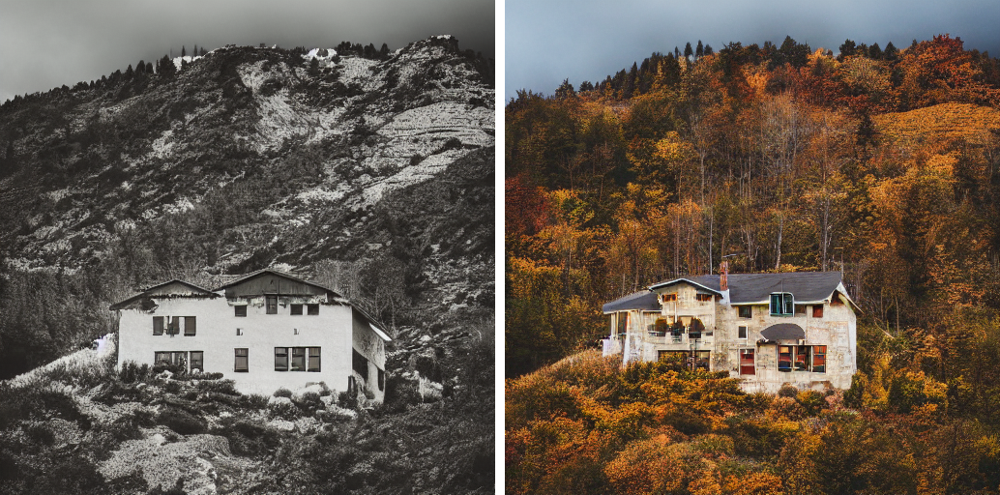

In [13]:
prompts = ["a photo of a house on a mountain",
           "a photo of a house on a mountain at fall"]


controller = AttentionRefine(prompts, NUM_DIFFUSION_STEPS, cross_replace_steps=.8,
                             self_replace_steps=.4)
_ = run_and_display(prompts, controller, latent=x_t)

In [14]:
prompts = ["a photo of a house on a mountain",
           "a photo of a house on a mountain at winter"]


controller = AttentionRefine(prompts, NUM_DIFFUSION_STEPS, cross_replace_steps=.8,
                             self_replace_steps=.4)
_ = run_and_display(prompts, controller, latent=x_t)

  0%|          | 0/51 [00:00<?, ?it/s]

KeyboardInterrupt: 

  0%|          | 0/51 [00:00<?, ?it/s]

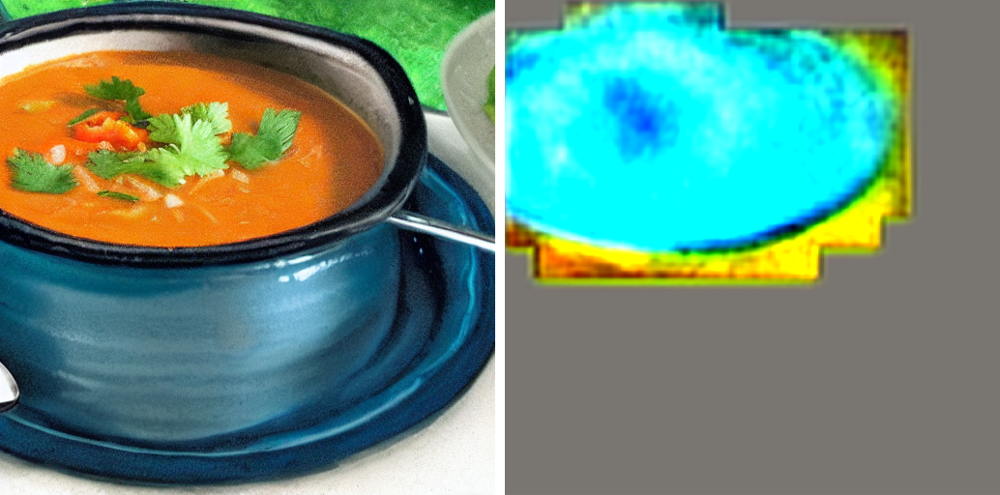

In [15]:
prompts = ["soup",
           "pea soup"] 

lb = LocalBlend(prompts, ("soup", "soup"))

controller = AttentionRefine(prompts, NUM_DIFFUSION_STEPS, cross_replace_steps=.8,
                             self_replace_steps=.4,
                             local_blend=lb)
_ = run_and_display(prompts, controller, latent=x_t, run_baseline=False)

## Attention Re-Weighting

  0%|          | 0/51 [00:00<?, ?it/s]

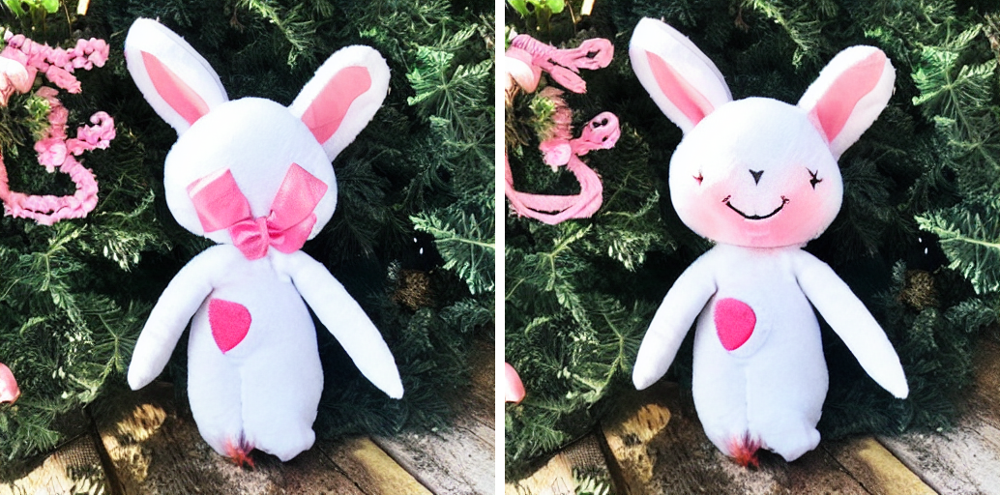

In [16]:
prompts = ["a smiling bunny doll"] * 2

### pay 3 times more attention to the word "smiling"
equalizer = get_equalizer(prompts[1], ("smiling",), (5,))
controller = AttentionReweight(prompts, NUM_DIFFUSION_STEPS, cross_replace_steps=.8,
                               self_replace_steps=.4,
                               equalizer=equalizer)
_ = run_and_display(prompts, controller, latent=x_t, run_baseline=False)

  0%|          | 0/51 [00:00<?, ?it/s]

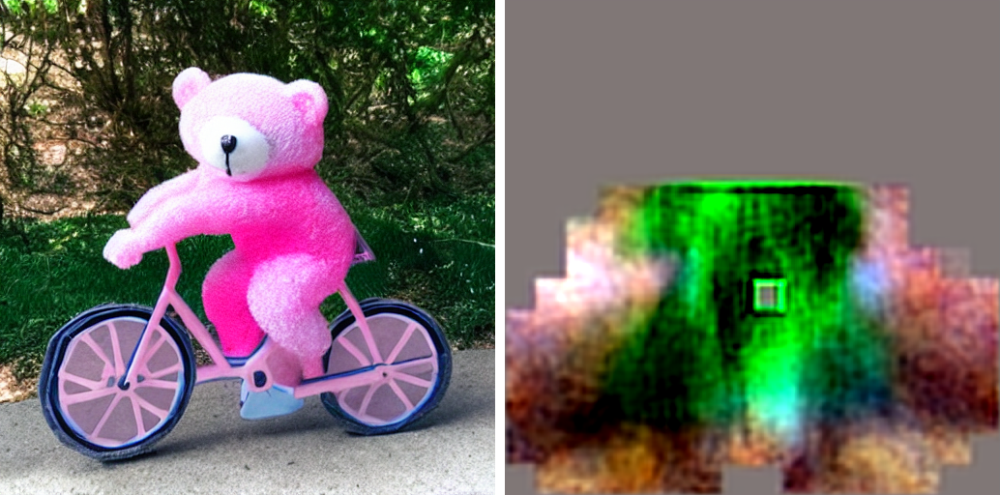

In [17]:
prompts = ["pink bear riding a bicycle"] * 2

### we don't wont pink bikes, only pink bear.
### we reduce the amount of pink but apply it locally on the bikes (attention re-weight + local mask )

### pay less attention to the word "pink"
equalizer = get_equalizer(prompts[1], ("pink",), (-1,))

### apply the edit on the bikes 
lb = LocalBlend(prompts, ("bicycle", "bicycle"))
controller = AttentionReweight(prompts, NUM_DIFFUSION_STEPS, cross_replace_steps=.8,
                               self_replace_steps=.4,
                               equalizer=equalizer,
                               local_blend=lb)
_ = run_and_display(prompts, controller, latent=x_t, run_baseline=False)

### Where are my croutons?
It might be useful to use Attention Re-Weighting with a previous edit method.

  0%|          | 0/51 [00:00<?, ?it/s]

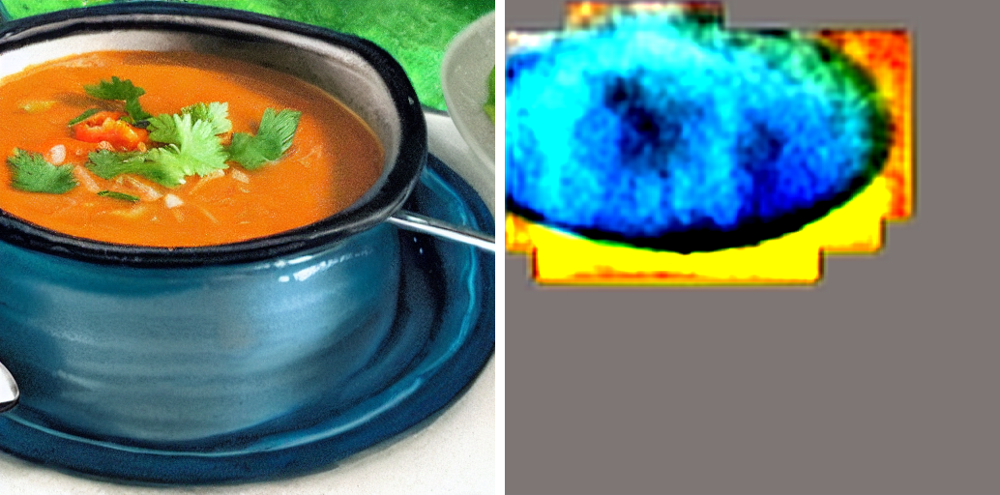

In [18]:
prompts = ["soup",
           "pea soup with croutons"] 
lb = LocalBlend(prompts, ("soup", "soup"))
controller = AttentionRefine(prompts, NUM_DIFFUSION_STEPS, cross_replace_steps=.8,
                             self_replace_steps=.4, local_blend=lb)
_ = run_and_display(prompts, controller, latent=x_t, run_baseline=False)

Now, with more attetnion to `"croutons"`

  0%|          | 0/51 [00:00<?, ?it/s]

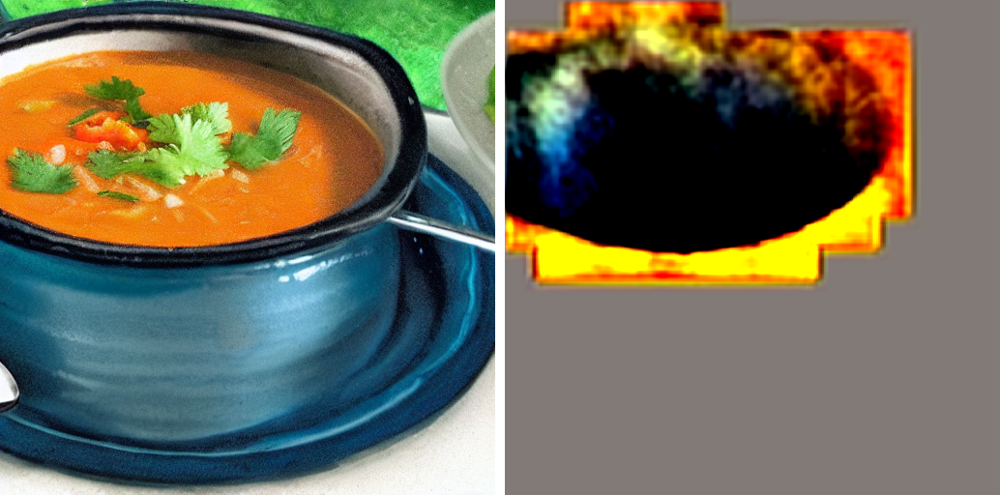

In [19]:
prompts = ["soup",
           "pea soup with croutons"] 


lb = LocalBlend(prompts, ("soup", "soup"))
controller_a = AttentionRefine(prompts, NUM_DIFFUSION_STEPS, cross_replace_steps=.8, 
                               self_replace_steps=.4, local_blend=lb)

### pay 3 times more attention to the word "croutons"
equalizer = get_equalizer(prompts[1], ("croutons",), (3,))
controller = AttentionReweight(prompts, NUM_DIFFUSION_STEPS, cross_replace_steps=.8,
                               self_replace_steps=.4, equalizer=equalizer, local_blend=lb,
                               controller=controller_a)
_ = run_and_display(prompts, controller, latent=x_t, run_baseline=False)

  0%|          | 0/51 [00:00<?, ?it/s]

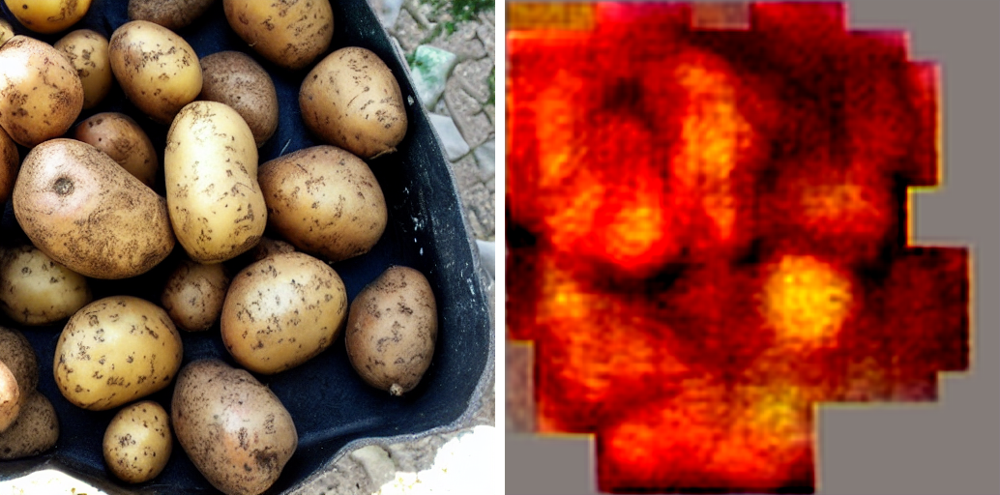

In [20]:
prompts = ["potatos",
           "fried potatos"] 
lb = LocalBlend(prompts, ("potatos", "potatos"))
controller = AttentionRefine(prompts, NUM_DIFFUSION_STEPS, cross_replace_steps=.8,
                             self_replace_steps=.4, local_blend=lb)
_ = run_and_display(prompts, controller, latent=x_t, run_baseline=False)

  0%|          | 0/51 [00:00<?, ?it/s]

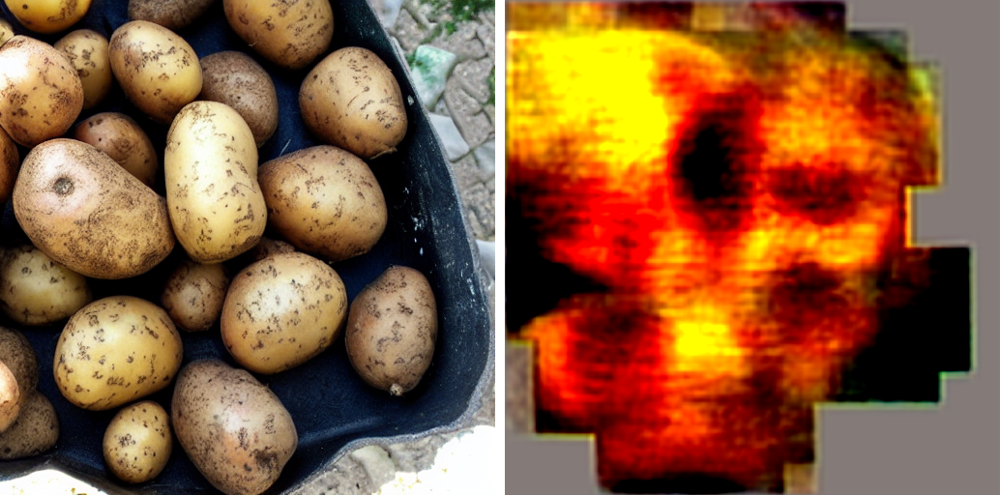

In [21]:
prompts = ["potatos",
           "fried potatos"] 
lb = LocalBlend(prompts, ("potatos", "potatos"))
controller = AttentionRefine(prompts, NUM_DIFFUSION_STEPS, cross_replace_steps=.8, 
                             self_replace_steps=.4, local_blend=lb)

### pay 10 times more attention to the word "fried"
equalizer = get_equalizer(prompts[1], ("fried",), (10,))
controller = AttentionReweight(prompts, NUM_DIFFUSION_STEPS, cross_replace_steps=.8,
                               self_replace_steps=.4, equalizer=equalizer, local_blend=lb,
                               controller=controller_a)
_ = run_and_display(prompts, controller, latent=x_t, run_baseline=False)

# Anime girls

  0%|          | 0/51 [00:00<?, ?it/s]

Step offset default: 1


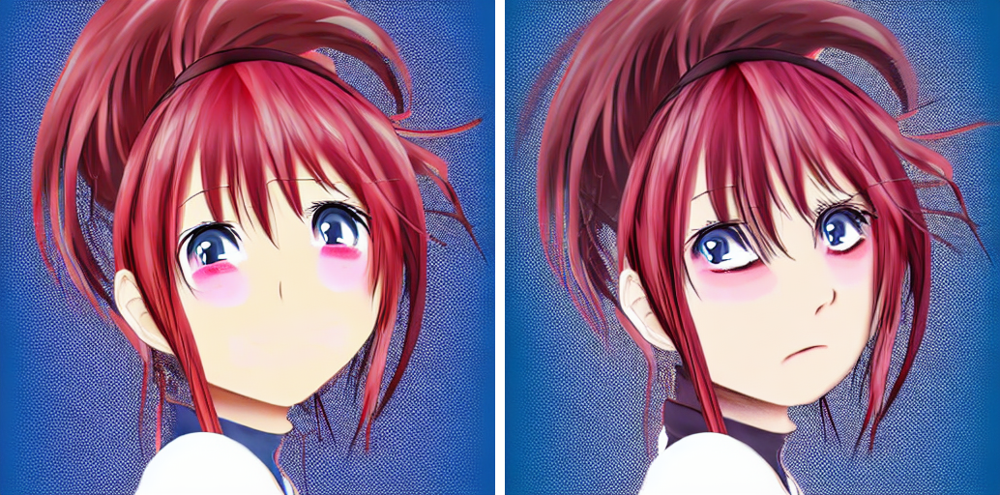

In [16]:
prompts = ["a happy anime girl, in the style of a colorful anime, head shot, on a white background"]
prompts += ["a depressed anime girl, in the style of a colorful anime, head shot, on a white background"]


controller = AttentionRefine(prompts, NUM_DIFFUSION_STEPS, cross_replace_steps=.8,
                             self_replace_steps=.4)
_ = run_and_display(prompts, controller, latent=x_t)

In [17]:
prompts = ["a happy anime girl facing right, in the style of a colorful anime, head shot, on a white background"]
prompts += ["a depressed anime girl facing left, in the style of a colorful anime, head shot, on a white background"]


controller = AttentionRefine(prompts, NUM_DIFFUSION_STEPS, cross_replace_steps=.8,
                             self_replace_steps=.4)
_ = run_and_display(prompts, controller, latent=x_t)

  0%|          | 0/51 [00:00<?, ?it/s]

KeyboardInterrupt: 